In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from scipy.stats import linregress

In [2]:
df = pd.read_csv("/content/Crimes_-_2001_to_Present.csv")
df.head()


,ID,Case Number,Date,Block,IUCR,Primary Type,Description,Location Description,Arrest,Domestic,...,Ward,Community Area,FBI Code,X Coordinate,Y Coordinate,Year,Updated On,Latitude,Longitude,Location
0,5741943,HN549294,08/25/2007 09:22:18 AM,074XX N ROGERS AVE,560,ASSAULT,SIMPLE,OTHER,False,False,...,49.0,1.0,08A,NaN,NaN,2007,08/17/2015 03:03:40 PM,NaN,NaN,NaN
1,25953,JE240540,05/24/2021 03:06:00 PM,020XX N LARAMIE AVE,110,HOMICIDE,FIRST DEGREE MURDER,STREET,True,False,...,36.0,19.0,01A,1141387.0,1913179.0,2021,11/18/2023 03:39:49 PM,41.917838,-87.755969,"(41.917838056, -87.755968972)"
2,26038,JE279849,06/26/2021 09:24:00 AM,062XX N MC CORMICK RD,110,HOMICIDE,FIRST DEGREE MURDER,PARKING LOT,True,False,...,50.0,13.0,01A,1152781.0,1941458.0,2021,11/18/2023 03:39:49 PM,41.995219,-87.713355,"(41.995219444, -87.713354912)"
3,13279676,JG507211,11-09-2023 07:30,019XX W BYRON ST,620,BURGLARY,UNLAWFUL ENTRY,APARTMENT,False,False,...,47.0,5.0,5,1162518.0,1925906.0,2023,11/18/2023 03:39:49 PM,41.952345,-87.677975,"(41.952345086, -87.677975059)"
4,13274752,JG501049,11-12-2023 07:59,086XX S COTTAGE GROVE AVE,454,BATTERY,"AGGRAVATED P.O. - HANDS, FISTS, FEET, NO / MIN...",SMALL RETAIL STORE,True,False,...,6.0,44.0,08B,1183071.0,1847869.0,2023,12-09-2023 15:41,41.737751,-87.604856,"(41.737750767, -87.604855911)"


In [3]:
df.tail()

,ID,Case Number,Date,Block,IUCR,Primary Type,Description,Location Description,Arrest,Domestic,...,Ward,Community Area,FBI Code,X Coordinate,Y Coordinate,Year,Updated On,Latitude,Longitude,Location
1048570,2459751,HH782764,11/16/2002 08:25:00 AM,031XX W PERSHING RD,820,THEFT,$500 AND UNDER,RESIDENCE,False,False,...,14.0,58.0,6,1156055.0,1878582.0,2002,02-10-2018 15:50,41.822617,-87.703011,"(41.822616668, -87.703011119)"
1048571,2392993,HH703984,10-09-2002 23:05,078XX S CHAPPEL AVE,1330,CRIMINAL TRESPASS,TO LAND,APARTMENT,False,False,...,8.0,43.0,26,1191227.0,1853471.0,2002,02-10-2018 15:50,41.752930,-87.574794,"(41.752929824, -87.574793987)"
1048572,2516196,HH848872,12/19/2002 07:10:00 PM,041XX W DICKENS AVE,2022,NARCOTICS,POSS: COCAINE,STREET,True,False,...,30.0,20.0,18,1148292.0,1913629.0,2002,02-10-2018 15:50,41.918943,-87.730588,"(41.918942533, -87.730587818)"
1048573,2510644,HH855240,12/22/2002 08:15:00 PM,023XX N SPRINGFIELD AVE,1320,CRIMINAL DAMAGE,TO VEHICLE,STREET,False,False,...,30.0,22.0,14,1149994.0,1915239.0,2002,02/28/2018 03:56:25 PM,41.923328,-87.724292,"(41.923327523, -87.724292425)"
1048574,2490675,HH797512,11/23/2002 02:20:00 PM,007XX W DIVISION ST,2017,NARCOTICS,MANU/DELIVER:CRACK,CHA PARKING LOT/GROUNDS,True,False,...,27.0,8.0,18,1171234.0,1908233.0,2002,02/28/2018 03:56:25 PM,41.903662,-87.646455,"(41.903662214, -87.646455447)"


## Data preprocessing


In [4]:
df.columns

Index(['ID', 'Case Number', 'Date', 'Block', 'IUCR', 'Primary Type',
       'Description', 'Location Description', 'Arrest', 'Domestic', 'Beat',
       'District', 'Ward', 'Community Area', 'FBI Code', 'X Coordinate',
       'Y Coordinate', 'Year', 'Updated On', 'Latitude', 'Longitude',
       'Location'],
      dtype='object')

In [5]:
df.shape

(1048575, 22)

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1048575 entries, 0 to 1048574
Data columns (total 22 columns):
 #   Column                Non-Null Count    Dtype  
---  ------                --------------    -----  
 0   ID                    1048575 non-null  int64  
 1   Case Number           1048575 non-null  object 
 2   Date                  1048575 non-null  object 
 3   Block                 1048575 non-null  object 
 4   IUCR                  1048575 non-null  object 
 5   Primary Type          1048575 non-null  object 
 6   Description           1048575 non-null  object 
 7   Location Description  1046899 non-null  object 
 8   Arrest                1048575 non-null  bool   
 9   Domestic              1048575 non-null  bool   
 10  Beat                  1048575 non-null  int64  
 11  District              1048575 non-null  int64  
 12  Ward                  433846 non-null   float64
 13  Community Area        436320 non-null   float64
 14  FBI Code              1048575 non-

What crimes are most prevalent in Chicago?


In [ ]:
## Check if any rows are missing data and are null
df['Primary Type'].isnull().values.any()

False

In [ ]:
## Count number of observations for each crime
df['Primary Type'].value_counts()

Primary Type
THEFT                                212336
BATTERY                              197884
CRIMINAL DAMAGE                      118128
NARCOTICS                             92913
ASSAULT                               72631
OTHER OFFENSE                         66084
MOTOR VEHICLE THEFT                   64099
BURGLARY                              49913
ROBBERY                               40213
DECEPTIVE PRACTICE                    38626
CRIMINAL TRESPASS                     26802
WEAPONS VIOLATION                     13190
HOMICIDE                              13152
PROSTITUTION                          10812
OFFENSE INVOLVING CHILDREN             5833
PUBLIC PEACE VIOLATION                 5247
SEX OFFENSE                            4986
CRIM SEXUAL ASSAULT                    2937
LIQUOR LAW VIOLATION                   2783
ARSON                                  2191
CRIMINAL SEXUAL ASSAULT                1698
GAMBLING                               1694
KIDNAPPING         

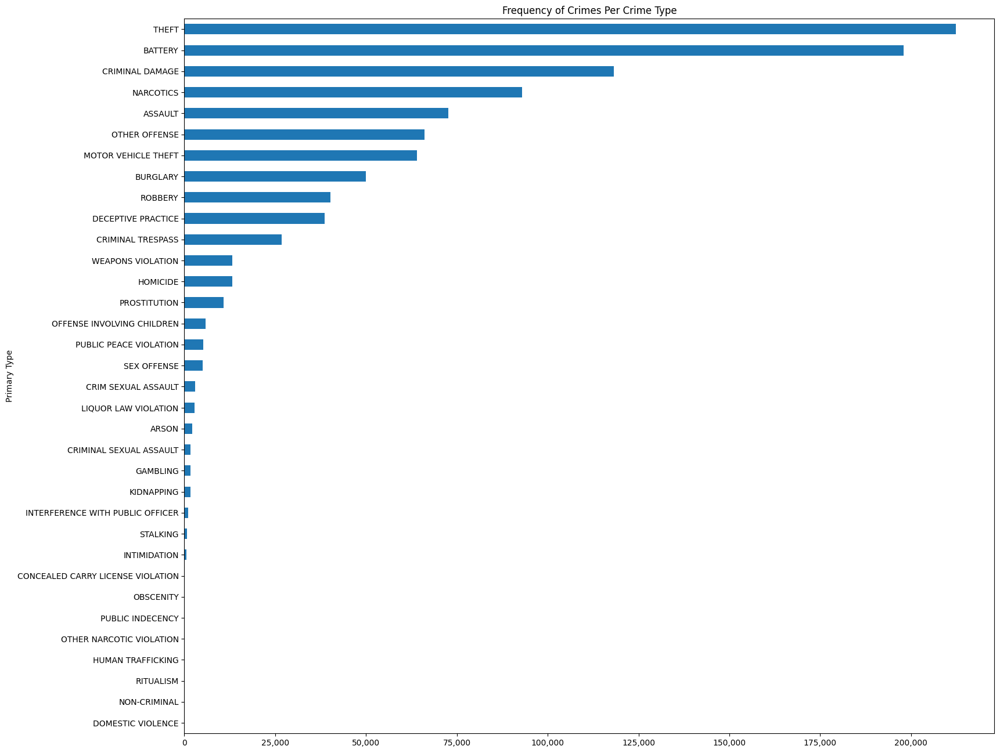

In [ ]:
## Plot these for better visualization
crime_type_df = df['Primary Type'].value_counts(ascending=True)

## Some formatting to make it look nicer
fig=plt.figure(figsize=(18, 16))
plt.title("Frequency of Crimes Per Crime Type")
plt.xlabel("Frequency of Crimes")
plt.ylabel("Type of Crime")
ax = crime_type_df.plot(kind='barh')
ax.get_xaxis().set_major_formatter(plt.FuncFormatter(lambda x, loc: "{:,}".format(int(x))))
plt.show()

## What year had the most crime?


In [ ]:
df['Year'].isnull().values.any()


False

In [ ]:
df['Year'].value_counts()


Year
2001    484102
2002    352272
2024    100323
2023     89158
2022      4303
2021      2069
2020      1730
2003      1193
2016      1149
2018      1128
2017      1085
2019      1014
2008       860
2015       819
2009       810
2006       765
2005       756
2012       755
2007       737
2004       735
2010       723
2013       703
2014       701
2011       685
Name: count, dtype: int64

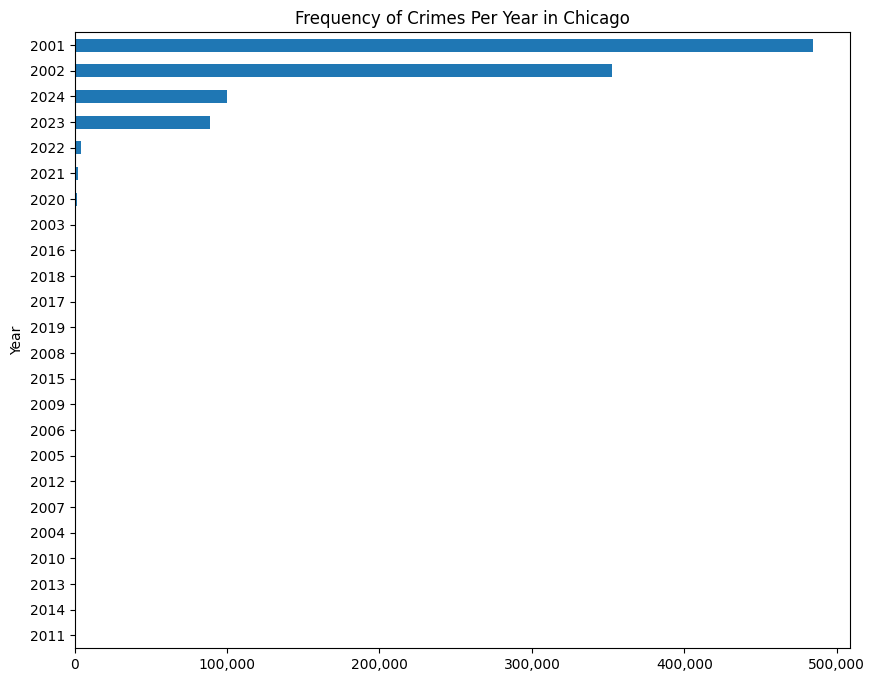

In [ ]:
## Plot these for better visualization
crime_year_df = df['Year'].value_counts(ascending=True)

## Some formatting to make it look nicer
fig=plt.figure(figsize=(10, 8))
plt.title("Frequency of Crimes Per Year in Chicago")
plt.xlabel("Frequency of Crimes")
plt.ylabel("Year")
ax = crime_year_df.plot(kind='barh')
ax.get_xaxis().set_major_formatter(plt.FuncFormatter(lambda x, loc: "{:,}".format(int(x))))
plt.show()

## What percentage of arrests were successful?



In [ ]:
df['Arrest'].isnull().values.any()

False

In [ ]:
## Count number of successful arrests for each year
df['Arrest'].value_counts()

Arrest
False    772257
True     276318
Name: count, dtype: int64

In [ ]:
## Convert values into percentages
arrest_df = df['Arrest'].value_counts()
arrest_percent = (arrest_df / df['Arrest'].sum()) * 100

## Rename Series.name
arrest_percent.rename("% of Arrests",inplace=True)

## Rename True and False to % Arrested and % Not Arrested
arrest_percent.rename({True: '% Arrested', False: '% Not Arrested'},inplace=True)

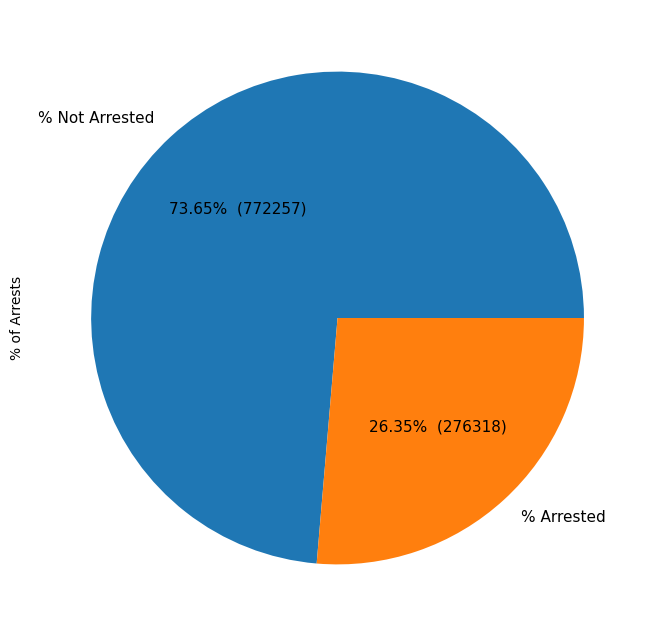

In [ ]:
## Format pie chart to nicely show percentage and count
def make_autopct(values):
    def my_autopct(pct):
        total = sum(values)
        val = int(round(pct*total/100.0))
        return '{p:.2f}%  ({v:d})'.format(p=pct,v=val)
    return my_autopct

## Plot results in a pie chart
arrest_percent.plot.pie(fontsize=11,
                       autopct=make_autopct(df['Arrest'].value_counts()),
                       figsize=(8, 8))
plt.show()

## What are the successful arrest percentages per year?

In [ ]:
## Group dataset by year and arrests
arrest_per_year = df.groupby('Year')['Arrest'].value_counts().rename('Counts').to_frame()
arrest_per_year['Percentage'] = (100 * arrest_per_year / arrest_per_year.groupby(level=0).sum())
arrest_per_year.reset_index(level=[1],inplace=True)
arrest_per_year

,Arrest,Counts,Percentage
Year,,,
2001,False,342312,70.710718
2001,True,141790,29.289282
2002,False,248544,70.554571
2002,True,103728,29.445429
2003,False,691,57.921207
2003,True,502,42.078793
2004,False,393,53.469388
2004,True,342,46.530612
2005,False,427,56.481481


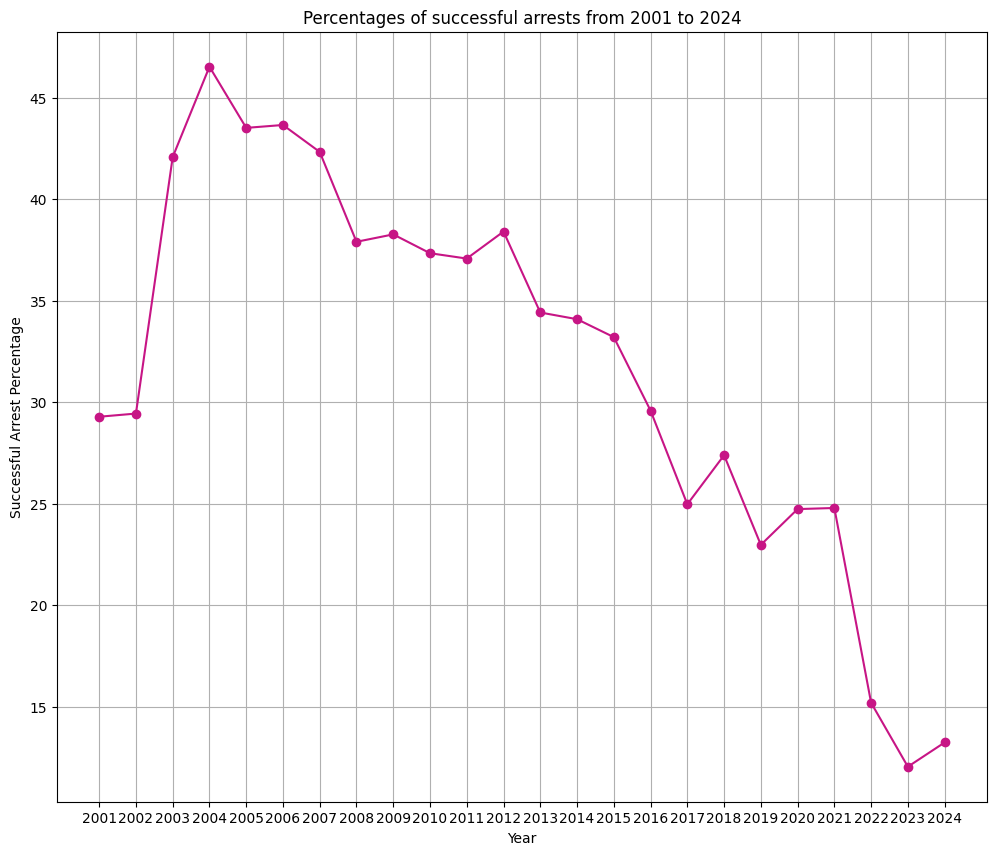

In [ ]:
## Create a line plot for percentages of successful arrests over time (2001 to present)
line_plot = arrest_per_year[arrest_per_year['Arrest'] == True]['Percentage']

## Configure line plot to make visualizing data cleaner
labels = line_plot.index.values
fig=plt.figure(figsize=(12, 10))
plt.title('Percentages of successful arrests from 2001 to 2024')
plt.xlabel("Year")
plt.ylabel("Successful Arrest Percentage")
plt.xticks(line_plot.index, line_plot.index.values)

line_plot.plot(grid=True, marker='o', color='mediumvioletred')
plt.show()

## Data visualization for crimes based on district from 2001 to present


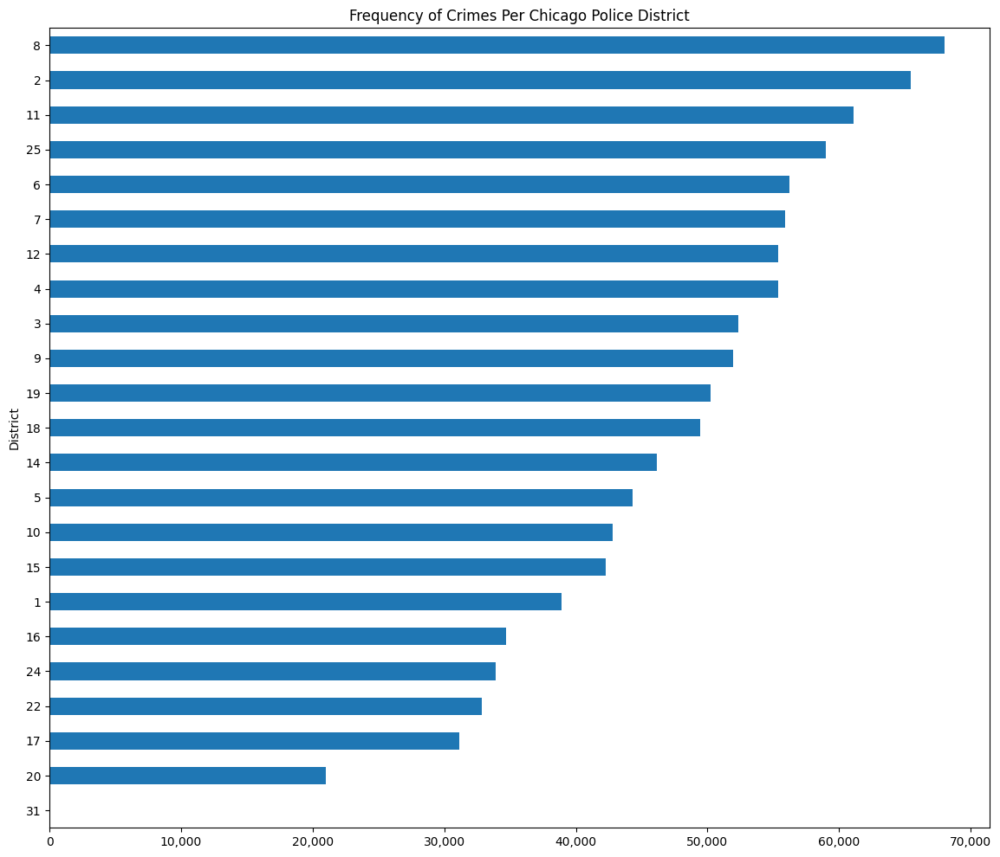

In [ ]:
# calculating total number of incidents per district
district_crime = df['District'].value_counts(ascending=True)

## Data cleaning
district_crime.index = district_crime.index.astype(int)
district_crime.index = district_crime.index.astype(str)

## Plot bar graph for initial visualization
fig=plt.figure(figsize=(14, 12))
plt.title("Frequency of Crimes Per Chicago Police District")
plt.xlabel("Frequency of Crimes")
plt.ylabel("Chicago Police District No.")
ax = district_crime.plot(kind='barh')
ax.get_xaxis().set_major_formatter(plt.FuncFormatter(lambda x, loc: "{:,}".format(int(x))))
plt.show()

In [ ]:
df['Primary Type'] = df['Primary Type'].replace(
    {'MOTOR VEHICLE THEFT': 'THEFT', 'ROBBERY': 'THEFT'})
df["Primary Type"].value_counts()

Primary Type
THEFT                                316648
BATTERY                              197884
CRIMINAL DAMAGE                      118128
NARCOTICS                             92913
ASSAULT                               72631
OTHER OFFENSE                         66084
BURGLARY                              49913
DECEPTIVE PRACTICE                    38626
CRIMINAL TRESPASS                     26802
WEAPONS VIOLATION                     13190
HOMICIDE                              13152
PROSTITUTION                          10812
OFFENSE INVOLVING CHILDREN             5833
PUBLIC PEACE VIOLATION                 5247
SEX OFFENSE                            4986
CRIM SEXUAL ASSAULT                    2937
LIQUOR LAW VIOLATION                   2783
ARSON                                  2191
CRIMINAL SEXUAL ASSAULT                1698
GAMBLING                               1694
KIDNAPPING                             1637
INTERFERENCE WITH PUBLIC OFFICER       1134
STALKING           

In [ ]:
df['Location Description'].value_counts().head(10)

Location Description
STREET                            319359
RESIDENCE                         183475
APARTMENT                          92702
SIDEWALK                           64613
OTHER                              36222
PARKING LOT/GARAGE(NON.RESID.)     26810
ALLEY                              24167
SMALL RETAIL STORE                 19545
SCHOOL, PUBLIC, BUILDING           17797
RESIDENCE-GARAGE                   17383
Name: count, dtype: int64

## How Many of Are Arrested Having Location Type is STREET

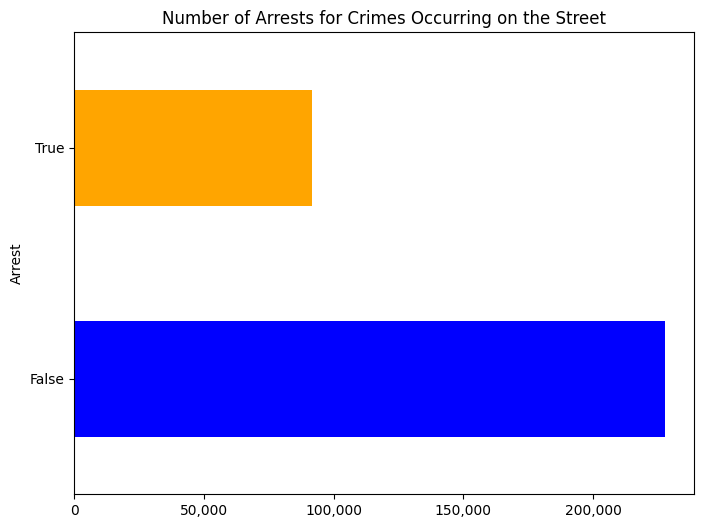

In [ ]:
## Plot bar graph for initial visualization
street_df = df[df['Location Description'] == "STREET"]
street_arrests =street_df['Arrest'].value_counts()
fig=plt.figure(figsize=(8, 6))
plt.title("Number of Arrests for Crimes Occurring on the Street")
plt.xlabel("Number of Crimes")
plt.ylabel("Arrest Status (False: Not Arrested, True: Arrested)")
ax = street_arrests.plot(kind='barh', color=['blue', 'orange'])
ax.get_xaxis().set_major_formatter(plt.FuncFormatter(lambda x, loc: "{:,}".format(int(x))))
plt.show()

In [ ]:
print(df.columns)

Index(['id', 'case_number', 'date', 'block', 'iucr', 'primary_type',
       'description', 'location_description', 'arrest', 'domestic', 'beat',
       'district', 'ward', 'community_area', 'fbi_code', 'x_coordinate',
       'y_coordinate', 'year', 'updated_on', 'latitude', 'longitude',
       'location'],
      dtype='object')


In [ ]:
Num_crimes_type = df['primary_type'].value_counts()
crime_type_df = pd.DataFrame({
    'Primary Type': Num_crimes_type.index,
    'Values': Num_crimes_type.values
})

In [ ]:
# Pie Plot showing Top 10 crimes in Chicago
crime_type_df.columns = ['primary_type', 'values']
fig = px.pie(crime_type_df[:10], values='values', names='primary_type', title='Top 10 Crime Type', color_discrete_sequence=px.colors.sequential.RdBu)
fig.show()

## Map geospatial

In [ ]:
import numpy as np
import folium
import seaborn as sns
import plotly.express as px

In [ ]:
df = df.dropna()

In [ ]:
df[['District', 'Ward','Community Area']] = df[['District', 'Ward','Community Area']].astype('int')
df[['District', 'Ward','Community Area']] = df[['District', 'Ward','Community Area']].astype('str')


In [ ]:
df.columns= df.columns.str.strip().str.lower().str.replace(' ','_')

In [ ]:
df.columns= df.columns.str.strip().str.lower().str.replace(' ','_')

## Wards

In [ ]:
import geopandas as gpd
ward_geo_url = r'https://data.cityofchicago.org/api/geospatial/sp34-6z76?method=export&format=GeoJSON'
ward_geo = gpd.read_file(ward_geo_url)

WardData = pd.DataFrame(df['ward'].value_counts(ascending=True).astype(float)).reset_index()

WardData.columns = ['ward', 'Crime_Count']

ward_geo['ward'] = ward_geo['ward'].astype(str)
WardData['ward'] = WardData['ward'].astype(str)

merged = ward_geo.merge(WardData, how='left', left_on='ward', right_on='ward')
#myscale = (WardData['Crime_Count'].quantile((0, 0.50, 0.65, 0.90, 0.98, 1))).tolist()

# Define style and highlight functions
def style_function(feature):
    return {
        'fillOpacity': 0.7,
        'weight': 0.2
    }

def highlight_function(feature):
    return {
        'fillColor': '#000000',
        'color': '#000000',
        'fillOpacity': 0.5,
        'weight': 0.1
    }

map1 = folium.Map(location=[41.815117282, -87.669999562], zoom_start=11)# tiles='')
folium.Choropleth(
    geo_data=merged,
    data=WardData,
    columns=['ward', 'Crime_Count'],
    key_on='feature.properties.ward',
    fill_color='Reds',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Number of incidents per police ward'
).add_to(map1)

folium.GeoJson(
    merged,
    style_function=style_function,
    control=False,
    highlight_function=highlight_function,
    tooltip=folium.features.GeoJsonTooltip(
        fields=['ward', 'Crime_Count'],
        aliases=["Ward Number: ", "Crime Count: "],
        style=("background-color: white; color: #333333; font-family: arial; font-size: 12px; padding: 10px;")
    )
).add_to(map1)
map1


## Districts

In [ ]:
import geopandas as gpd
district_geo_url  = r'https://data.cityofchicago.org/api/geospatial/fthy-xz3r?method=export&format=GeoJSON'
district_geo = gpd.read_file(district_geo_url)
#calculating total number of incidents per district
DisData = pd.DataFrame(df['district'].value_counts().astype(float)).reset_index()
DisData.columns = ['district', 'Crime_Count']

# Ensure the district column is of the same type for merging
district_geo['dist_num'] = district_geo['dist_num'].astype(str)
DisData['district'] = DisData['district'].astype(str)

# Merge the GeoDataFrame with the crime data DataFrame
merged = district_geo.merge(DisData, how='left', left_on='dist_num', right_on='district')


#myscale = (DisData['Crime_Count'].quantile((0,0.40,0.60,0.9,0.98,1))).tolist()

map2 = folium.Map(location=[41.815117282, -87.669999562], zoom_start=11, )#tiles='Mapbox Bright')
folium.Choropleth(
    geo_data=merged,
    data=DisData,
    columns=['district', 'Crime_Count'],
    key_on='feature.properties.dist_num',
    fill_color='Reds',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Number of incidents per police district'
).add_to(map2)

def style_function(feature):
    return {
        'fillOpacity': 0.7,
        'weight': 0.2
    }

def highlight_function(feature):
    return {
        'fillColor': '#000000',
        'color': '#000000',
        'fillOpacity': 0.5,
        'weight': 0.1
    }

folium.GeoJson(
        merged,
        style_function=style_function,
        control=False,
        highlight_function=highlight_function,
        tooltip=folium.GeoJsonTooltip(
            fields=[
                'dist_num',
                'dist_label',
                'Crime_Count'
            ],
            aliases=[
                "District Number: ",
                "District Label: ",
                "Crime Count: "
            ],
            style=("background-color: white; color: #333333; font-family: arial; font-size: 12px; padding: 10px;")
            )
        ).add_to(map2)



map2

## Community Area

In [ ]:
import geopandas as gpd
# URL to the GeoJSON data
com_geo_url = r'https://data.cityofchicago.org/api/geospatial/cauq-8yn6?method=export&format=GeoJSON'

# Load the GeoJSON data
com_geo = gpd.read_file(com_geo_url)

# Calculate the total number of incidents per community area
ComData = pd.DataFrame(df['community_area'].value_counts().astype(float)).reset_index()
ComData.columns = ['community_area', 'Crime_Count']

# Ensure the community_area column is of the same type for merging
com_geo['area_numbe'] = com_geo['area_numbe'].astype(str)
ComData['community_area'] = ComData['community_area'].astype(str)

# Merge the GeoDataFrame with the crime data DataFrame
merged = com_geo.merge(ComData, how='left', left_on='area_numbe', right_on='community_area')

# Create the map
map3 = folium.Map(location=[41.815117282, -87.669999562], zoom_start=11)

# Add choropleth layer
folium.Choropleth(
    geo_data=merged,
    data=ComData,
    columns=['community_area', 'Crime_Count'],
    key_on='feature.properties.area_numbe',
    fill_color='Reds',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Number of incidents per community area'
).add_to(map3)

# Define style and highlight functions
def style_function(feature):
    return {
        'fillOpacity': 0.7,
        'weight': 0.2
    }

def highlight_function(feature):
    return {
        'fillColor': '#000000',
        'color': '#000000',
        'fillOpacity': 0.5,
        'weight': 0.1
    }

# Add GeoJson layer with tooltips
folium.GeoJson(
    merged,
    style_function=style_function,
    control=False,
    highlight_function=highlight_function,
    tooltip=folium.GeoJsonTooltip(
        fields=['area_numbe', 'community', 'Crime_Count'],
        aliases=["Area Number: ", "Name: ", "Crime Count: "],
        style=("background-color: white; color: #333333; font-family: arial; font-size: 12px; padding: 10px;")
    )
).add_to(map3)

map3


In [ ]:
df.columns

Index(['ID', 'Case Number', 'Date', 'Block', 'IUCR', 'Primary Type',
       'Description', 'Location Description', 'Arrest', 'Domestic', 'Beat',
       'District', 'Ward', 'Community Area', 'FBI Code', 'X Coordinate',
       'Y Coordinate', 'Year', 'Updated On', 'Latitude', 'Longitude',
       'Location'],
      dtype='object')

In [ ]:
# ML Regression

In [3]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import LabelEncoder
from sklearn.impute import SimpleImputer

# Load the preprocessed dataset
df_1 = pd.read_csv('/content/Crimes_-_2001_to_Present.csv')

# Define features (X) and target variable (y)
target_column_name = 'Primary Type'
X = df_1.drop(columns=[target_column_name])
y = df_1[target_column_name]

# Impute missing values for numerical columns
num_imputer = SimpleImputer(strategy='mean')
X[X.select_dtypes(include=['number']).columns] = num_imputer.fit_transform(X.select_dtypes(include=['number']))

# Impute missing values for categorical columns
cat_imputer = SimpleImputer(strategy='most_frequent')
X[X.select_dtypes(include=['object']).columns] = cat_imputer.fit_transform(X.select_dtypes(include=['object']))


label_encoders = {}
for column in X.select_dtypes(include=['object']).columns:
    le = LabelEncoder()
    X[column] = le.fit_transform(X[column])
    label_encoders[column] = le

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize a Random Forest Classifier
rf_model = RandomForestClassifier()

# Train the model
rf_model.fit(X_train, y_train)

# Make predictions on the test set
rf_predictions_rf = rf_model.predict(X_test)
rf_accuracy = accuracy_score(y_test, rf_predictions_rf)
print('Random Forest Accuracy:', rf_accuracy)


# Initialize and train an AdaBoost Classifier
ada_model = AdaBoostClassifier()
ada_model.fit(X_train, y_train)
predictions_ada = ada_model.predict(X_test)
accuracy_ada = accuracy_score(y_test, predictions_ada)
print('AdaBoost Accuracy:', accuracy_ada)

Random Forest Accuracy: 0.9995803829006032
AdaBoost Accuracy: 0.40249386071573323
